In [1]:
# Jupyter Notebook auto-reload extension
%load_ext autoreload
%autoreload 2

# Jupyter Notebook matplotlib inline extension
%matplotlib inline

In [2]:
import sys
sys.path.append("..")  
import os
import scienceplots
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datasets.fobss import FOBSS
from datasets.utils import *
from datasets.attack import *


import torch
import torch.nn as nn
import torch.nn.functional as F

# set the plotting style
plt.style.use(['science', 'ieee'])

# set font family
plt.rcParams['font.sans-serif'] = ['Noto Sans CJK JP', 'Noto Sans CJK SC', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False   


# fix the random seed for reproducibility
np.random.seed(42)
torch.manual_seed(42)

Loaded data from ../data/EBAI/raw/BMS_Data_2026-01-22T11-16-48-168Z.csv with shape (4000, 34)
Dataset saved to ../data//EBAI/train/EBAI-slave@-interval@10.0s.csv


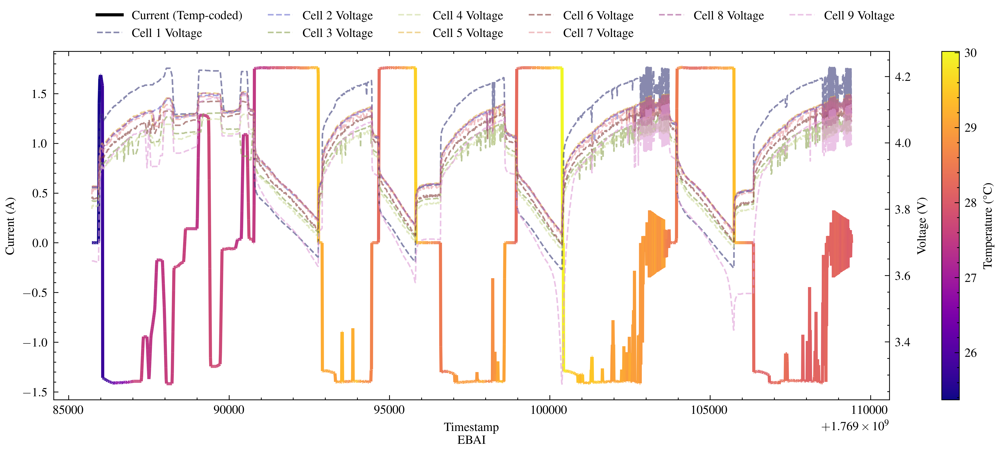

In [3]:
def preprocess_ebai_data(root_folder: str='../', filename: str=''):

    # Load data
    file_path = os.path.join(root_folder, filename)
    data = pd.read_csv(file_path)
    print(f"Loaded data from {file_path} with shape {data.shape}")

    # Convert timestamp to seconds since epoch
    data["timestamp"] = (pd.to_datetime(data["timestamp"]).astype('int64') / 1e9)

    df_I = pd.DataFrame(data['current_mA'].apply(lambda x: x / 1000))  # Convert mA to A
    df_I["timestamp"] = data["timestamp"].to_list()
    df_I.rename(columns={'current_mA': 'current in A'}, inplace=True)

    df_V = pd.DataFrame(data[[f'cell{i}_mV'.format(i) for i in range(1, 10)]].apply(lambda x: x / 1000))  # Convert mV to V
    df_V["timestamp"] = data["timestamp"].to_list()

    df_T = pd.DataFrame(data[[f'cell{i}_C'.format(i) for i in range(1, 10)]])
    df_T["timestamp"] = data["timestamp"].to_list()

    df_Tenv = pd.DataFrame(data['env_C'])
    df_Tenv["timestamp"] = data["timestamp"].to_list()

    # Apply median filter to smooth data
    df_I = apply_median_filter(df_I, window=7)
    df_V = apply_median_filter(df_V, window=7)
    df_T = apply_median_filter(df_T, window=7)

    # generate uniform timestamps
    uniform_timestamps = generate_uniform_timestamps(data["timestamp"], interval=10)

    # align dataframes to uniform timestamps
    df_I = align_timestamps(df_I, uniform_timestamps, method='linear')
    df_V = align_timestamps(df_V, uniform_timestamps, method='linear')
    df_T = align_timestamps(df_T, uniform_timestamps, method='linear')
    df_Tenv = align_timestamps(df_Tenv, uniform_timestamps, method='linear')

    return df_I, df_V, df_T, df_Tenv

df_I, df_V, df_T, df_Tenv = preprocess_ebai_data(root_folder='../data/EBAI/raw', filename='BMS_Data_2026-01-22T11-16-48-168Z.csv')
visualize_dataset(df_I, df_V, df_T, profile_name='EBAI')
df_Label = pd.DataFrame(np.zeros((df_I.shape[0], 1)), columns=['Label'])  # Dummy labels

ID = 'EBAI'
mkdatasets(df_I, df_V, df_T, df_Env=df_Tenv, df_Label=df_Label, ID='EBAI', datasetname='EBAI', type='train', save_dir='../data/', slave='', interval=10.0)

Loaded data from ../data/EBAI/raw/BMS_Data_2026-01-21T13-10-39-549Z.csv with shape (3347, 34)
Dataset saved to ../data//EBAI/test/EBAI-N-slave@-interval@10.0s.csv


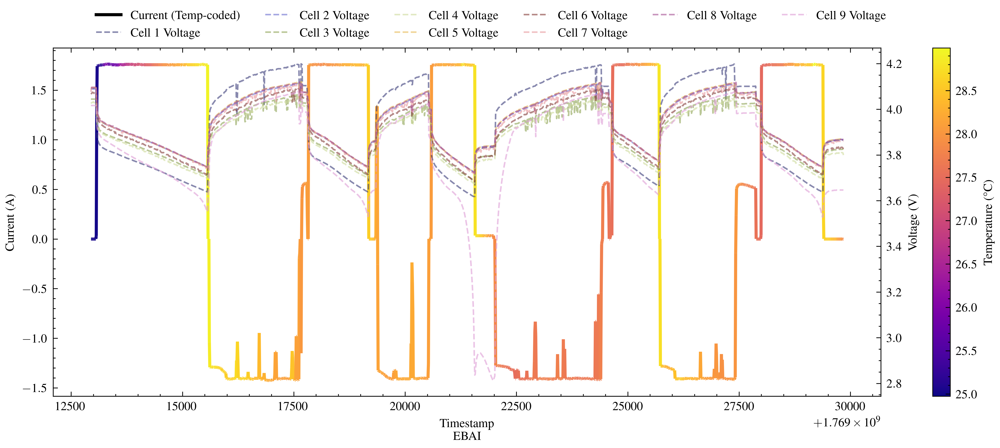

In [4]:
df_I, df_V, df_T, df_Tenv = preprocess_ebai_data(root_folder='../data/EBAI/raw', filename='BMS_Data_2026-01-21T13-10-39-549Z.csv')
visualize_dataset(df_I, df_V, df_T, profile_name='EBAI')

ID = 'EBAI-N'
df_Label = pd.DataFrame(np.zeros((df_I.shape[0], 1)), columns=['Label'])  # Dummy labels
mkdatasets(df_I, df_V, df_T, df_Tenv, df_Label=df_Label, ID=ID, datasetname='EBAI', type='test', save_dir='../data/', slave='', interval=10.0)

Loaded data from ../data/EBAI/raw/BMS_Data_2026-01-21T13-10-39-549Z.csv with shape (3347, 34)
Dataset saved to ../data//EBAI/test/EBAI-A1-slave@-interval@10.0s.csv
Dataset saved to ../data//EBAI/test/EBAI-A2-slave@-interval@10.0s.csv
Dataset saved to ../data//EBAI/test/EBAI-A3-slave@-interval@10.0s.csv
Dataset saved to ../data//EBAI/test/EBAI-A4-slave@-interval@10.0s.csv
Dataset saved to ../data//EBAI/test/EBAI-A5-slave@-interval@10.0s.csv
Dataset saved to ../data//EBAI/test/EBAI-A6-slave@-interval@10.0s.csv
Dataset saved to ../data//EBAI/test/EBAI-A7-slave@0-interval@10.0s.csv


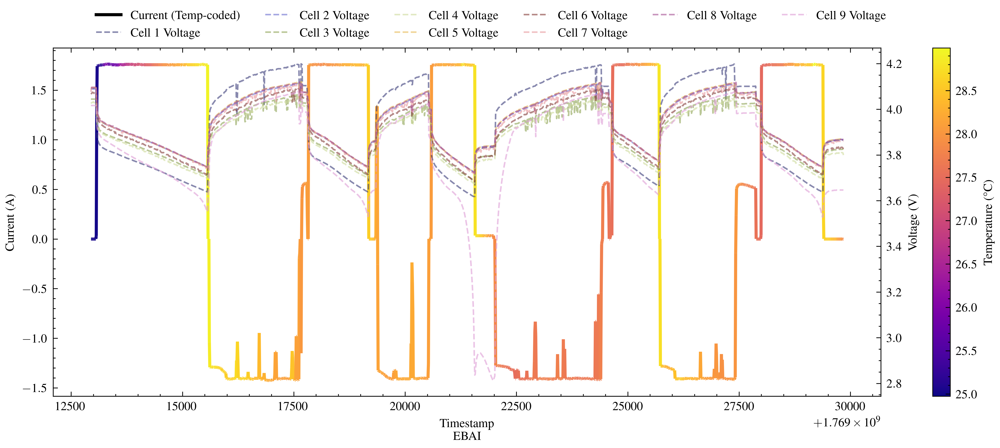

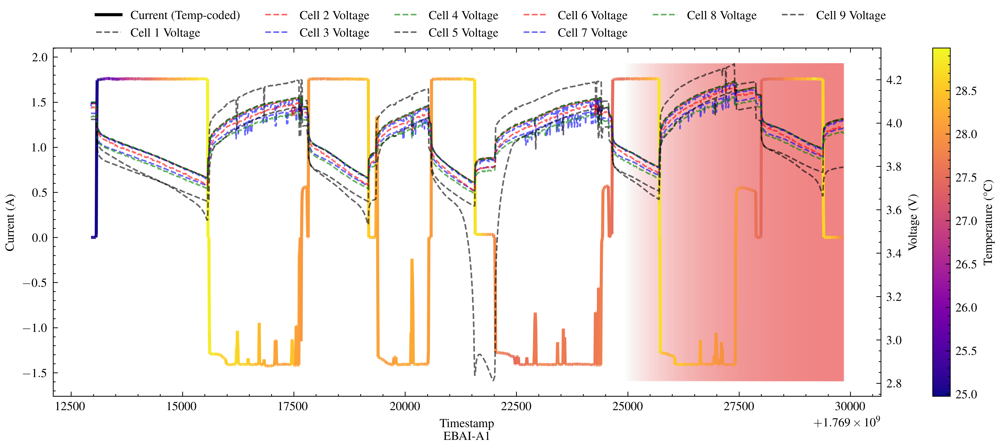

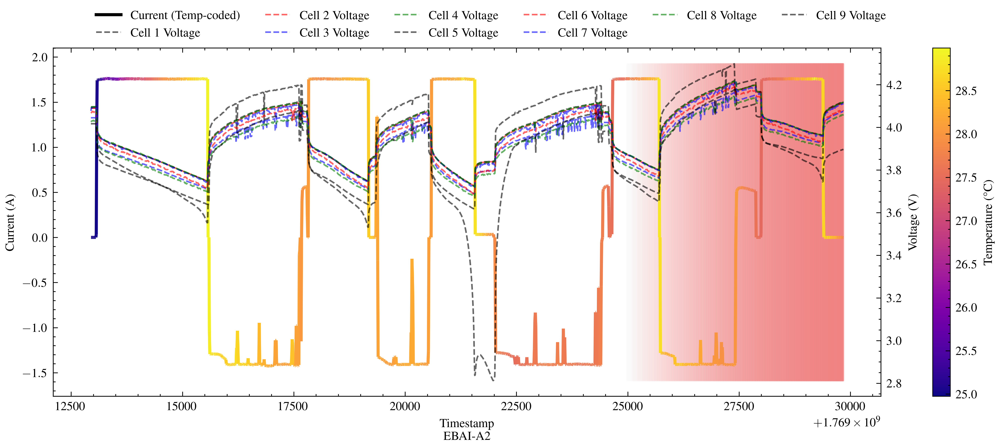

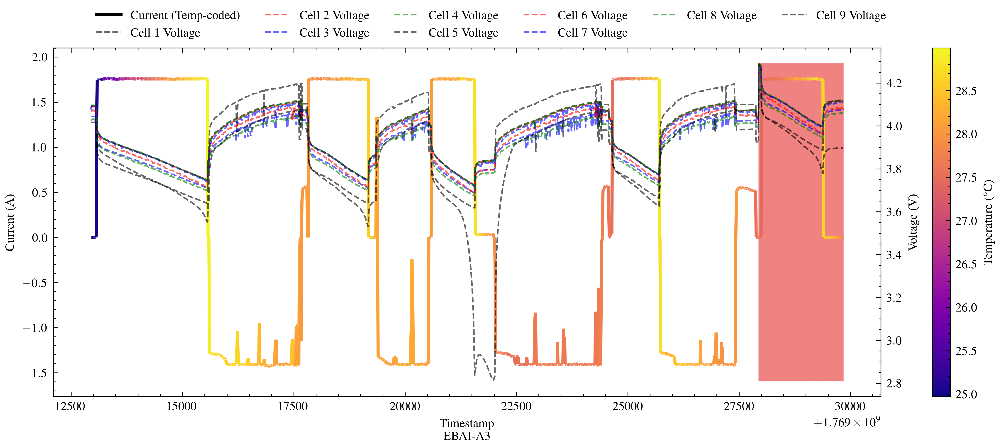

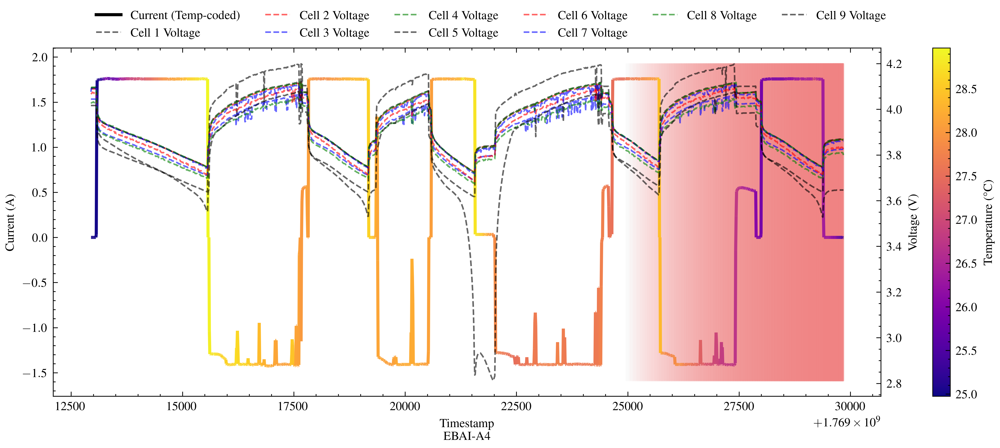

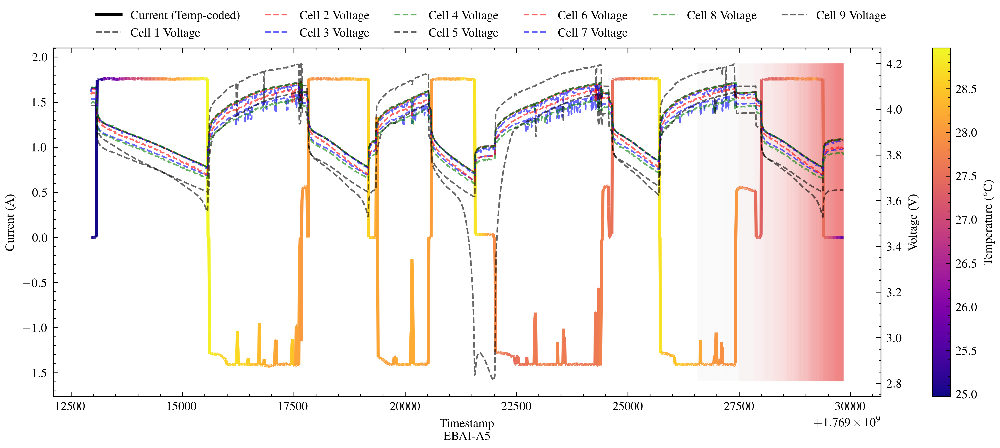

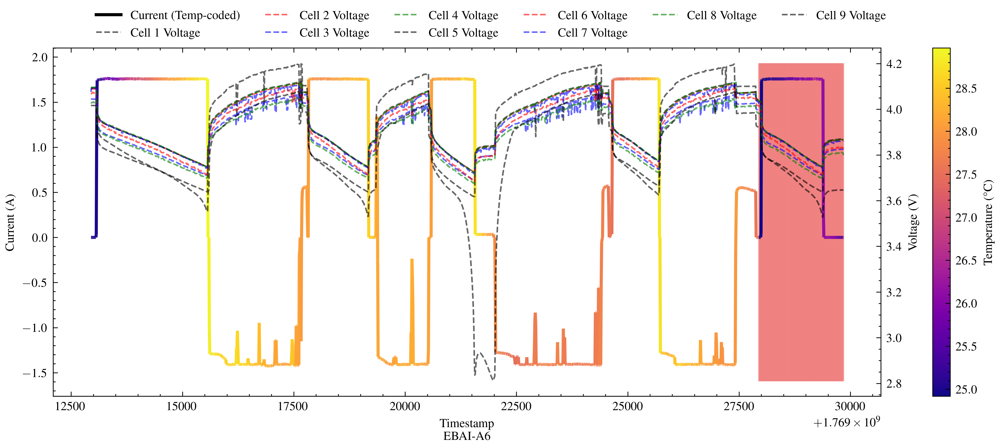

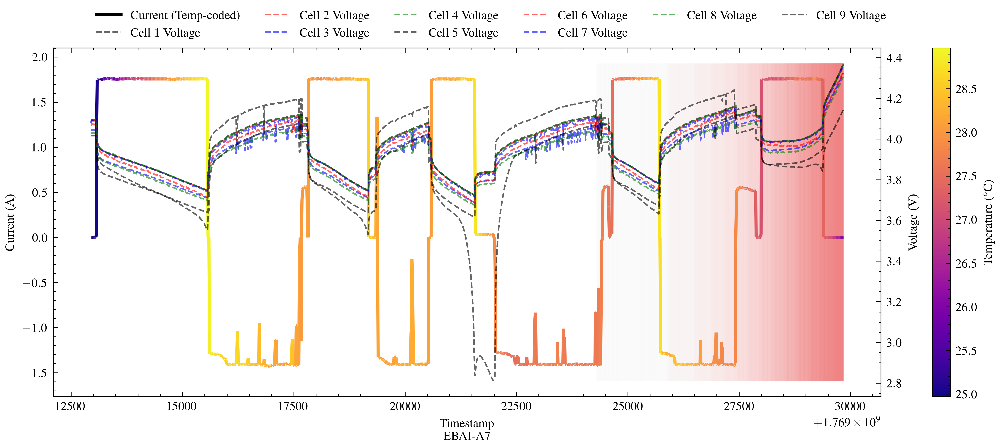

In [ ]:
ID = 'EBAI-A1'
df_V_attacked, df_V_attack_label = attack(data=df_V, cells=[i for i in range(df_V.shape[1])], bias_per_cell=[0.15 for _ in range(df_V.shape[1])], start_idx=1200, end_idx=-1, dt=10.0, bias_type='linear', tau_seconds=0.0)
visualize_dataset_with_label(df_I, df_V_attacked, df_T, df_V_attack_label, profile_name=ID)
df_Label = df_V_attack_label
mkdatasets(df_I, df_V_attacked, df_T, df_Tenv, df_Label=df_Label, ID=ID, datasetname='EBAI', type='test', save_dir='../data/', slave='', interval=10.0)

ID = 'EBAI-A2'
df_V_attacked, df_V_attack_label = attack(data=df_V, cells=[i for i in range(df_V.shape[1])], bias_per_cell=[0.25 for _ in range(df_V.shape[1])], start_idx=1200, end_idx=-1, dt=10.0, bias_type='exp', tau_seconds=6000.0)
visualize_dataset_with_label(df_I, df_V_attacked, df_T, df_V_attack_label, profile_name=ID)
df_Label = df_V_attack_label
mkdatasets(df_I, df_V_attacked, df_T, df_Tenv, df_Label=df_Label, ID=ID, datasetname='EBAI', type='test', save_dir='../data/', slave='', interval=10.0)

ID = 'EBAI-A3'
df_V_attacked, df_V_attack_label = attack(data=df_V, cells=[i for i in range(df_V.shape[1])], bias_per_cell=[0.25 for _ in range(df_V.shape[1])], start_idx=1500, end_idx=-1, dt=10.0, bias_type='step', tau_seconds=0.0)
visualize_dataset_with_label(df_I, df_V_attacked, df_T, df_V_attack_label, profile_name=ID)
df_Label = df_V_attack_label
mkdatasets(df_I, df_V_attacked, df_T, df_Tenv, df_Label=df_Label, ID=ID, datasetname='EBAI', type='test', save_dir='../data/', slave='', interval=10.0)

ID = 'EBAI-A4'
df_T_attacked, df_T_attack_label = attack(data=df_T, cells=[i for i in range(df_T.shape[1])], bias_per_cell=[-2.5 for _ in range(df_T.shape[1])], start_idx=1200, end_idx=-1, dt=10.0, bias_type='linear', tau_seconds=0.0)
visualize_dataset_with_label(df_I, df_V, df_T_attacked, df_T_attack_label, profile_name=ID)
df_Label = df_T_attack_label
mkdatasets(df_I, df_V, df_T_attacked, df_Tenv, df_Label=df_Label, ID=ID, datasetname='EBAI', type='test', save_dir='../data/', slave='', interval=10.0)

ID = 'EBAI-A5'
df_T_attacked, df_T_attack_label = attack(data=df_T, cells=[i for i in range(df_T.shape[1])], bias_per_cell=[-2.5 for _ in range(df_T.shape[1])], start_idx=1200, end_idx=-1, dt=10.0, bias_type='exp', tau_seconds=600.0)
visualize_dataset_with_label(df_I, df_V, df_T_attacked, df_T_attack_label, profile_name=ID)
df_Label = df_T_attack_label
mkdatasets(df_I, df_V, df_T_attacked, df_Tenv, df_Label=df_Label, ID=ID, datasetname='EBAI', type='test', save_dir='../data/', slave='', interval=10.0)

ID = 'EBAI-A6'
df_T_attacked, df_T_attack_label = attack(data=df_T, cells=[i for i in range(df_T.shape[1])], bias_per_cell=[-2.5 for _ in range(df_T.shape[1])], start_idx=1500, end_idx=-1, dt=10.0, bias_type='step', tau_seconds=0.0)
visualize_dataset_with_label(df_I, df_V, df_T_attacked, df_T_attack_label, profile_name=ID)
df_Label = df_T_attack_label
mkdatasets(df_I, df_V, df_T_attacked, df_Tenv, df_Label=df_Label, ID=ID, datasetname='EBAI', type='test', save_dir='../data/', slave='', interval=10.0)

ID = 'EBAI-A7'
df_V_attacked, df_V_attack_label = attack(data=df_V, cells=[i for i in range(df_V.shape[1])], bias_per_cell=[0.5 for _ in range(df_V.shape[1])], start_idx=200, end_idx=-1, dt=10.0, bias_type='exp', tau_seconds=1000.0)
df_T_attacked, df_T_attack_label = attack(data=df_T, cells=[i for i in range(df_T.shape[1])], bias_per_cell=[-2 for _ in range(df_T.shape[1])], start_idx=200, end_idx=-1, dt=10.0, bias_type='exp', tau_seconds=1000.0)

df_Label = 0.5*(df_V_attack_label + df_T_attack_label)
visualize_dataset_with_label(df_I, df_V_attacked, df_T_attacked, df_Label, profile_name=ID)
mkdatasets(df_I, df_V_attacked, df_T_attacked, df_Tenv, df_Label=df_Label, ID=ID, datasetname='EBAI', type='test', save_dir='../data/', slave='0', interval=10.0)
